# Setup

In [ ]:
import os
import sys
import json
import argparse

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib

from glob import glob
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm.second_level import make_second_level_design_matrix
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img

In [ ]:
from nilearn import plotting, datasets, surface

# for plotting slices
mni152_template = datasets.load_mni152_template(resolution=1)
# for plotting on surface
fsaverage = datasets.fetch_surf_fsaverage('fsaverage')

In [ ]:
task_label = 'tonecat'
space_label = 'MNI152NLin2009cAsym'

# define data directories
bidsroot = os.path.join('/bgfs/bchandrasekaran/krs228/data/', 
                        'FLT/',
                        'data_denoised',
                        #'data_bids',
                       )
nilearn_dir = os.path.join(bidsroot, 'derivatives', 'nilearn')

# define first-level directory where group-level inputs will be pulled from
l1_dir = os.path.join(nilearn_dir, 'level-1_fwhm-%.02f'%fwhm)

# create output directory
group_out_dir = os.path.join(nilearn_dir, 'group_fwhm-%.02f'%fwhm)
if not os.path.exists(group_out_dir):
        os.makedirs(group_out_dir)

# Second-level analyses

Based on [nilearn documentation](https://nilearn.github.io/stable/auto_examples/05_glm_second_level/plot_thresholding.html#statistical-testing-of-a-second-level-analysis)

### Build the group-level design matrix

#### Read the `participants.tsv` file from the BIDS root directory

In [ ]:
participants_fpath = os.path.join(bidsroot, 'participants.tsv')
participants_df = pd.read_csv(participants_fpath, sep='\t')

# subjects to ignore (not fully processed, etc.)
ignore_subs = ['sub-FLT27',
               'sub-FLT07', # bad QA 11/14/23
               #'sub-FLT02', 'sub-FLT04', 'sub-FLT18', 'sub-FLT19',
              ]
participants_df.drop(participants_df[participants_df.participant_id.isin(ignore_subs)].index, inplace=True)

# re-sort by participant ID
participants_df.sort_values(by=['participant_id'], ignore_index=True, inplace=True)

In [ ]:
print(participants_df)

In [ ]:
# create group-specific lists of subject IDs
sub_list_mand = list(participants_df.participant_id[participants_df.group=='Mandarin'])
sub_list_nman = list(participants_df.participant_id[participants_df.group=='non-Mandarin'])

In [ ]:
print(sub_list_mand)

In [ ]:
print(sub_list_nman)

#### Create design matrixes

In [ ]:
# get participant IDs and their group labels
subjects_label = list(participants_df.participant_id)
groups_label = list(participants_df.group)

# make new dataframe from the group labels
design_mat_groupdiff = pd.DataFrame({'Mand': groups_label,
                                     'NMan': groups_label,
                                    }
                                   )
# convert to 1s and 0s for each group as appropriate
design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'Mandarin'] = 1
design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'non-Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'non-Mandarin'] = 1
design_mat_groupdiff = design_mat_groupdiff.astype('int')
print(design_mat_groupdiff)

In [ ]:
# create NMan-specific design matrix
design_mat_nman = pd.DataFrame({'NMan': np.ones(len(sub_list_nman))})
print(design_mat_nman)

## Univariate correct - wrong model

### Get files

In [ ]:
contrast_label= 'fb-correct-vs-wrong' #'fb'
fwhm = 4.50

In [ ]:
sorted(glob(l1_dir + f'/*/run-all/*{contrast_label}*gz'))

In [ ]:
# get the beta map for the contrast of interest for each subject
l1_fnames_groupdiff = [sorted(glob(l1_dir+f'/{sub_id}_space-{space_label}/run-all/*{contrast_label}_map-beta.nii.gz'))[0] for sub_id in sub_list_nman]

### Non-Mandarin speaking group:

#### Using combined GLM, with contrast isolating non-Mandarin-speaking group

In [41]:
thresh_map_list = []
# create a model object
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_nman)

# fit the model with our contrast of interest
z_map = second_level_model.compute_contrast(second_level_contrast=[1,], output_type='z_score')

# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = None # None, 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )
thresh_map_list.append(thresholded_map)

z_fpath   = os.path.join(group_out_dir,
                         'group-NMan_space-{}_contrast-{}_map-zstat.nii.gz'.format(space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-NMan_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(space_label, contrast_label, 
                                                                                                                  alpha, cluster_correct, cthresh))
print(z_fpath)
print(thr_fpath)
nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)

/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/group_fwhm-4.50/group-NMan_space-MNI152NLin2009cAsym_contrast-fb-correct-vs-wrong_map-zstat.nii.gz
/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/group_fwhm-4.50/group-NMan_space-MNI152NLin2009cAsym_contrast-fb-correct-vs-wrong_alpha-0.05_correct-None_cthresh-10_map-zstat.nii.gz


The None=0.05 threshold is 3


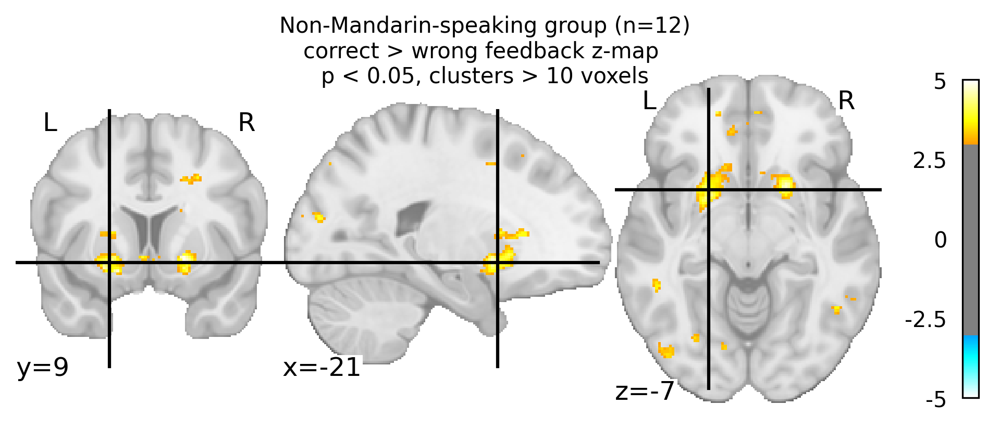

In [50]:
plot_title = ('Non-Mandarin-speaking group (n=%d)\n'
              'correct > wrong feedback z-map \n'
              'p < %.02f, clusters > %d voxels'%(len(sub_list_nman), alpha, cthresh))

fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    #cut_coords=[34, -22, 52],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
fig.savefig(os.path.join(group_out_dir,
                     'group-NMan_space-{}_contrast-{}_view-ortho.png'.format(space_label, contrast_label)))

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



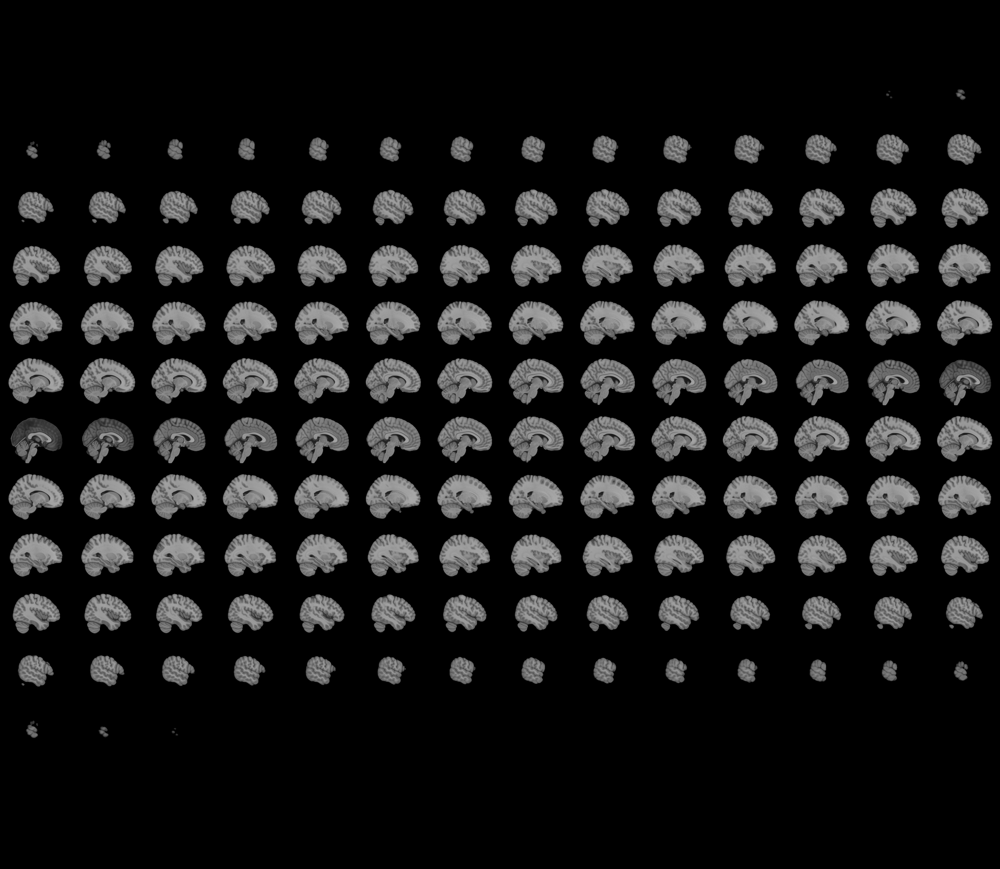
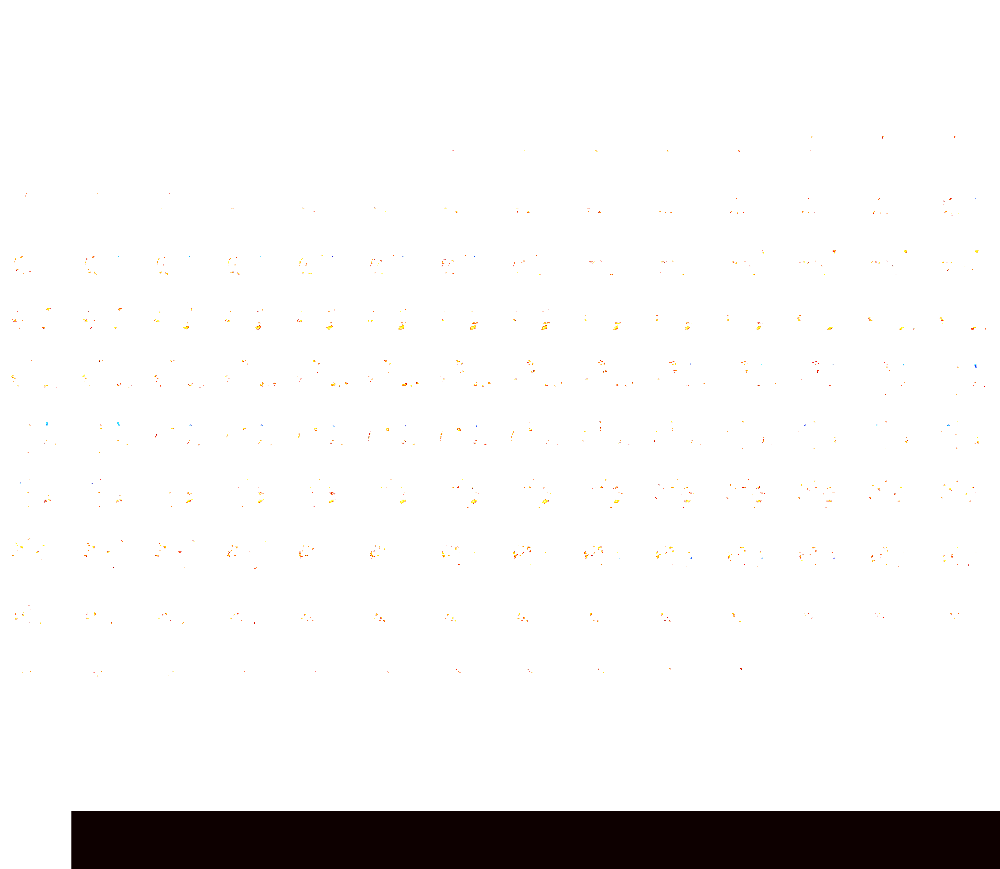

In [47]:
plotting.view_img(thresholded_map, 
                  bg_img=mni152_template,
                  title=f'NMan {contrast_label}',)

Test lower threshold:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



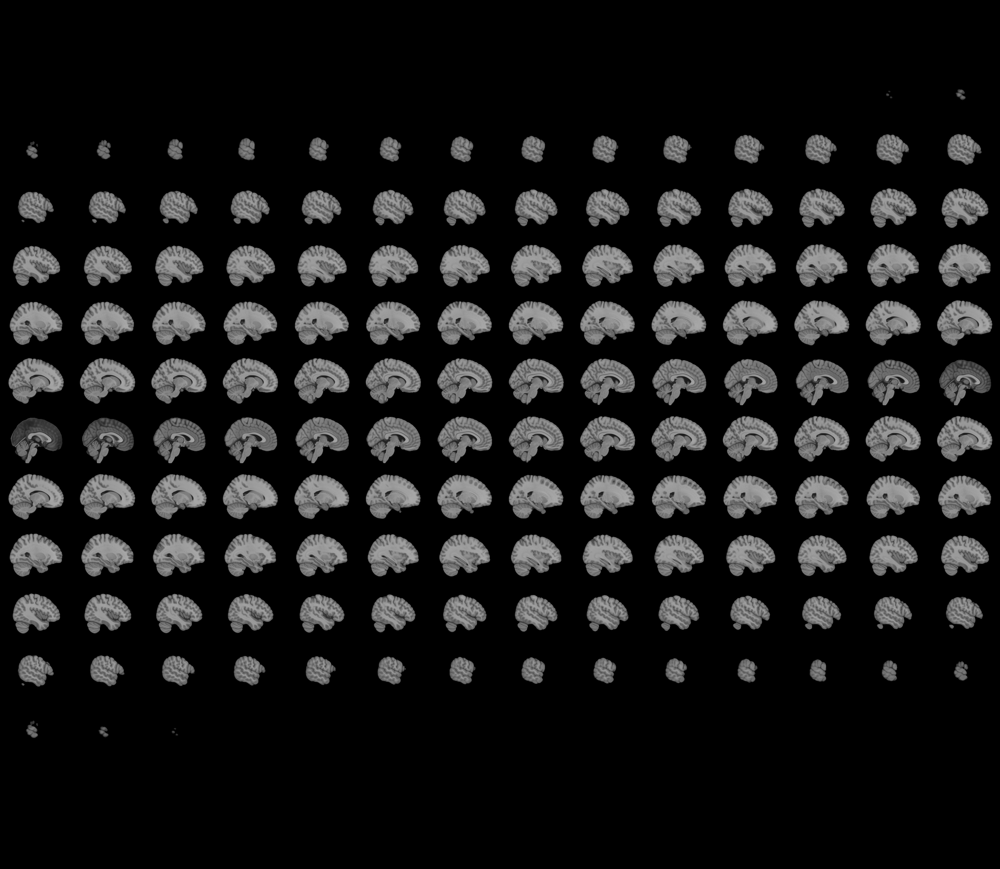
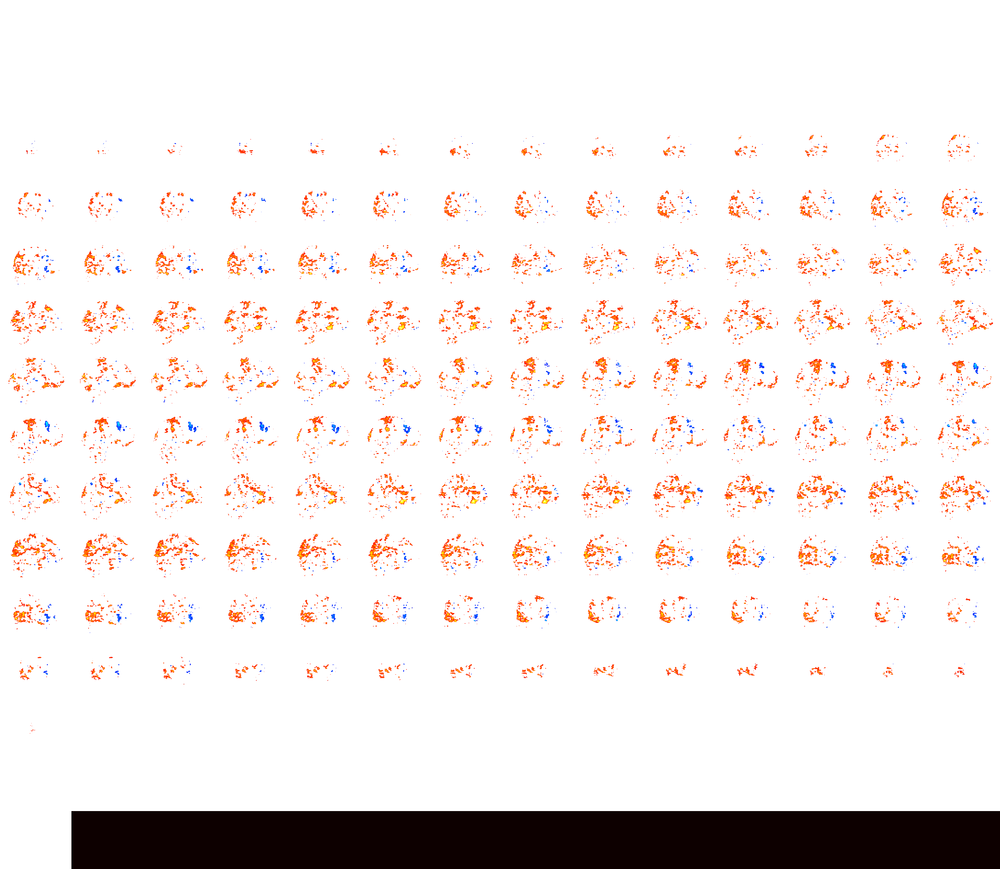

In [54]:
plotting.view_img(z_map, 
                  threshold=2, 
                  bg_img=mni152_template,
                  cut_coords=[-7, 16, -7],
                  title=f'NMan {contrast_label}')

#### High-res subcortical slices

Non-Mandarin-speaking group (n=12)
correct > wrong feedback z-map 
p < 0.05, clusters > 10 voxels


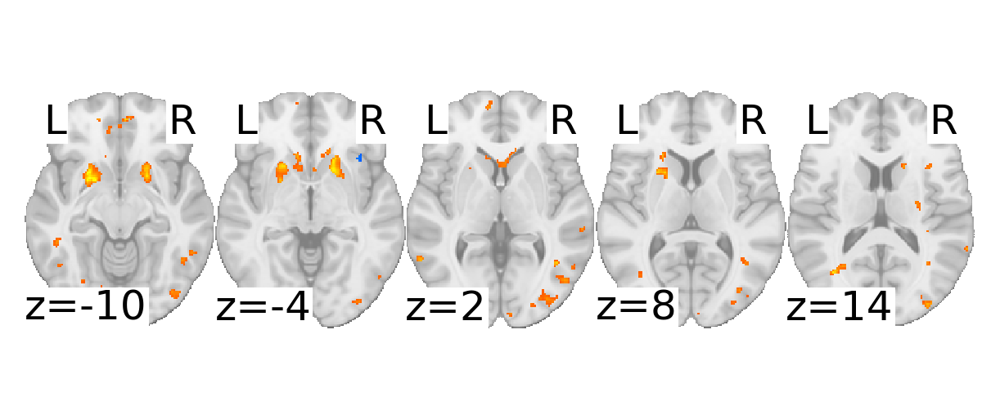

In [56]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
fig1.savefig(os.path.join(group_out_dir,
                     f'group-NMan_space-{space_label}_contrast-{contrast_label}_view-axial-subcort.png'))

### Individual subject plots

In [ ]:
#l1_fnames_dict = dict(sub_list_nman, l1_fnames_groupdiff)
maptype = 'tstat'
l1_fnames_tstat = [sorted(glob(l1_dir+f'/{sub_id}_space-{space_label}/run-all/*{contrast_label}_map-{maptype}.nii.gz'))[0] for sub_id in sub_list_nman]

In [ ]:
# threshold the stats image
alpha = 0.05
cthresh = 10
cluster_correct = None # None, 'fdr'

In [ ]:
for sx, sub_id in enumerate(sub_list_nman):
    stat_map = l1_fnames_tstat[sx]

    thresholded_map, zthresh = threshold_stats_img(
                                stat_map,
                                alpha=alpha,
                                height_control=cluster_correct,
                                cluster_threshold=cthresh,
                                two_sided=True,
                            )

    fig1, ax1 = plt.subplots(figsize=(7,2), dpi=300)

    title = f'{sub_id} correct > incorrect'

    plotting.plot_stat_map(thresholded_map,
                           bg_img=mni152_template,
                           threshold=zthresh,
                           vmax=6,
                           cut_coords=[-15, -10, -5, 0, 5, 10, 15],
                           display_mode='z',
                           colorbar=False, 
                           draw_cross=False, 
                           black_bg=False,
                           title=title,
                           axes=ax1)
    fig1.savefig(os.path.join('level-1_out',
                         f'group-NMan_{sub_id}_space-{space_label}_contrast-{contrast_label}_view-axial-subcort.png'))

## separate correct and wrong LSS models

### Get files

In [ ]:
contrast_label= 'fb'
fwhm = 0.

In [33]:
fb_list = ['fb_correct','fb_wrong']

In [55]:
# get the beta map for the contrast of interest for each subject
fb_fname_dict = {}
for fb_type in fb_list:
    fbtype_filelist = []
    for sub_id in sub_list_nman:
        try:
            sub_fpath = sorted(glob(l1_dir+f'/{sub_id}_space-{space_label}/run-all_LSS'+
                                               f'/*{fb_type}*_map-beta.nii.gz'))[0]
            fbtype_filelist.append(sub_fpath)
        except:
            fbtype_filelist.append('')
    fb_fname_dict[fb_type] = fbtype_filelist

In [56]:
fb_fname_dict

{'fb_correct': ['/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT02_space-MNI152NLin2009cAsym/run-all_LSS/sub-FLT02_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-fb_correct_model-LSS_map-beta.nii.gz',
  '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT04_space-MNI152NLin2009cAsym/run-all_LSS/sub-FLT04_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-fb_correct_model-LSS_map-beta.nii.gz',
  '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT06_space-MNI152NLin2009cAsym/run-all_LSS/sub-FLT06_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-fb_correct_model-LSS_map-beta.nii.gz',
  '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT09_space-MNI152NLin2009cAsym/run-all_LSS/sub-FLT09_task-tonecat_fwhm-0.00_space-MNI152NLin2009cAsym_contrast-fb_correct_model-LSS_map-beta.nii

### Non-Mandarin speaking group:

#### Using combined GLM, with contrast isolating non-Mandarin-speaking group

/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/group_fwhm-0.00/group-NMan_space-MNI152NLin2009cAsym_contrast-fb_correct_map-zstat.nii.gz
/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/group_fwhm-0.00/group-NMan_space-MNI152NLin2009cAsym_contrast-fb_correct_alpha-0.05_correct-None_cthresh-0_map-zstat.nii.gz
The None=0.05 threshold is 3
/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/group_fwhm-0.00/group-NMan_space-MNI152NLin2009cAsym_contrast-fb_wrong_map-zstat.nii.gz
/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/group_fwhm-0.00/group-NMan_space-MNI152NLin2009cAsym_contrast-fb_wrong_alpha-0.05_correct-None_cthresh-0_map-zstat.nii.gz
The None=0.05 threshold is 3


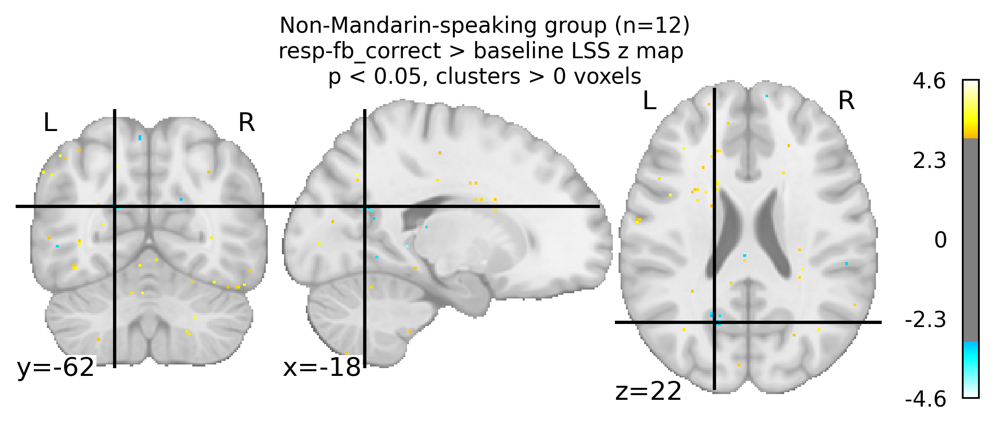

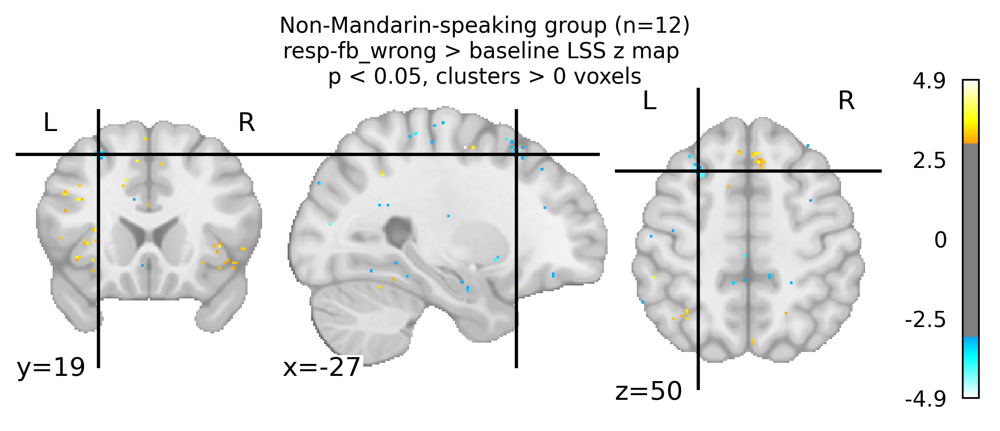

In [67]:
thresh_map_list = []
for fb_type in fb_list:
    l1_fnames_groupdiff = fb_fname_dict[fb_type]

    # create a model object
    second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_nman)

    # fit the model with our contrast of interest
    z_map = second_level_model.compute_contrast(second_level_contrast=[1,], output_type='z_score')

    # threshold the second-level stats image
    alpha = 0.05
    cthresh = 0#10
    cluster_correct = None #'fdr'

    thresholded_map, zthresh = threshold_stats_img(
                                z_map,
                                alpha=alpha,
                                height_control=cluster_correct,
                                cluster_threshold=cthresh,
                                two_sided=True,
                            )
    thresh_map_list.append(thresholded_map)
    
    z_fpath   = os.path.join(group_out_dir,
                             'group-NMan_space-{}_contrast-{}_map-zstat.nii.gz'.format(space_label, fb_type))
    thr_fpath = os.path.join(group_out_dir,
                             'group-NMan_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(space_label, fb_type, 
                                                                                                                      alpha, cluster_correct, cthresh))
    print(z_fpath)
    print(thr_fpath)
    nib.save(z_map, z_fpath)
    nib.save(thresholded_map, thr_fpath)

    plot_title = ('Non-Mandarin-speaking group (n=%d)\n'
                  'resp-%s > baseline LSS z map \n'
                  'p < %.02f, clusters > %d voxels'%(len(sub_list_nman), fb_type, alpha, cthresh))

    fig, ax = plt.subplots(figsize=(8,3), dpi=300)

    plotting.plot_stat_map(
        thresholded_map, 
        threshold=zthresh,
        bg_img=mni152_template,
        black_bg=False,
        #cut_coords=[34, -22, 52],
        #display_mode='mosaic',
        #title=plot_title,
        axes=ax)
    fig.suptitle(plot_title, fontsize=10);
    print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
    fig.savefig(os.path.join(group_out_dir,
                         'group-NMan_space-{}_contrast-{}_view-ortho.png'.format(space_label, fb_type)))
    

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



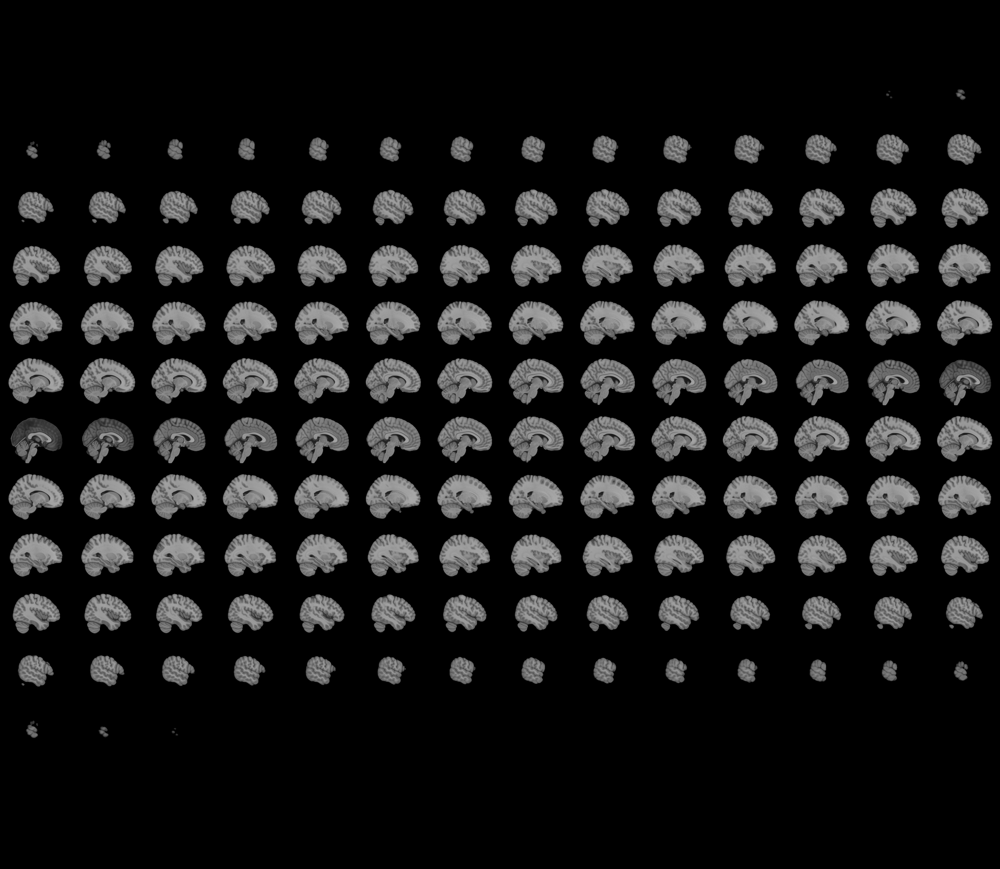
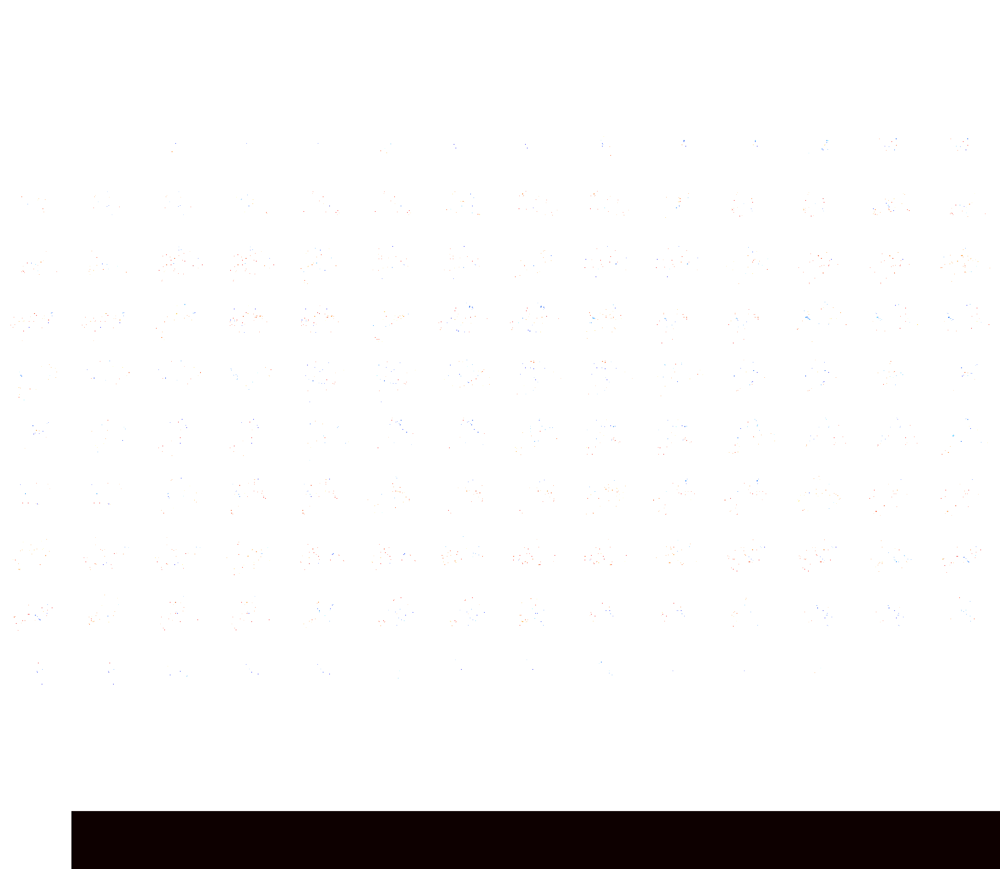

In [68]:
t = 0
plotting.view_img(thresh_map_list[t], 
                  #threshold=1, #zthresh, 
                  bg_img=mni152_template,
                  title=f'NMan {fb_list[t]}')

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



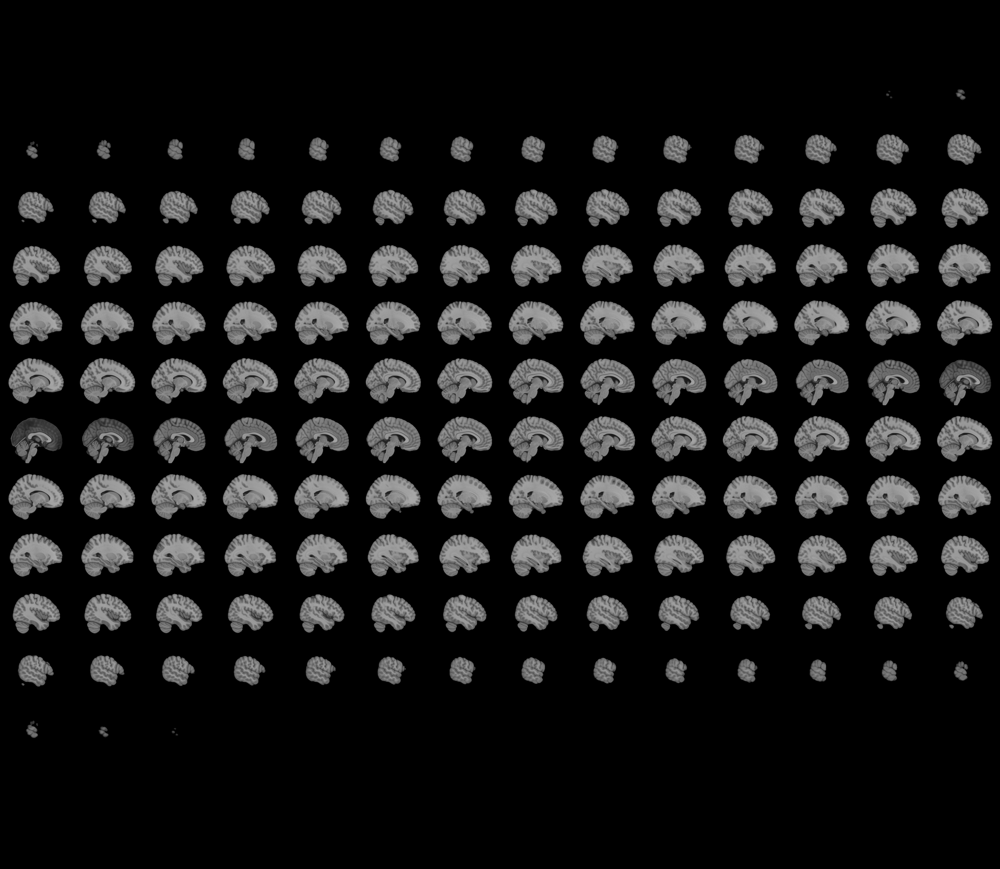
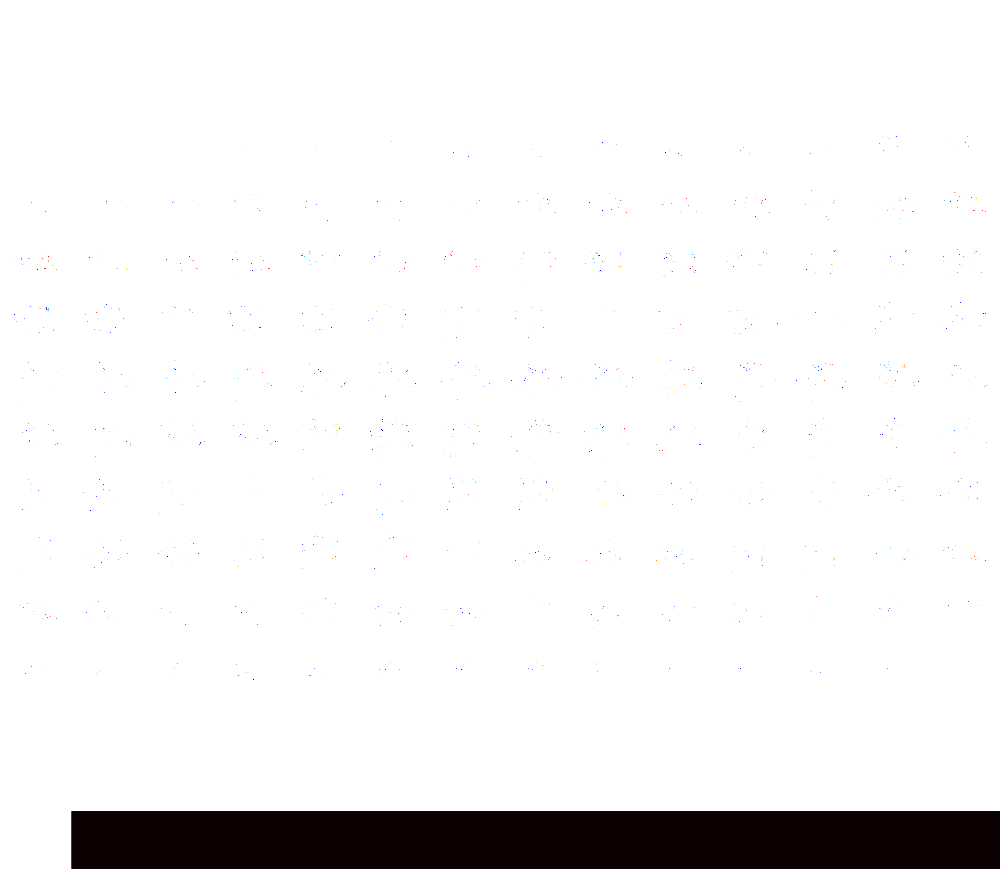

In [69]:
t = 1
plotting.view_img(thresh_map_list[t], 
                  #threshold=1, #zthresh, 
                  bg_img=mni152_template,
                  title=f'NMan {fb_list[t]}')

Test lower threshold:

In [ ]:
plotting.view_img(z_map, 
                  threshold=2, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title='NMan sound > baseline')

#### Surface plots:

In [ ]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()
fig2.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-surface.png'.format(group_label, space_label, contrast_label)))

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
fig1.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-axial-subcort.png'.format(group_label, space_label, contrast_label)))